## Data Mining Assignment#03

---------------------------------------------------------------------------------------------------------------------------------

- Name: Hammad Javaid
- Roll-number: i21-1661
- Section: DS-M

---------------------------------------------------------------------------------------------------------------------------------

In [2]:
from pathlib import Path
from PIL import Image
import matplotlib as mpl
import matplotlib.pyplot as plt
import cv2
import numpy as np
import timeit
from tqdm import tqdm
import math

#### unique colors within seed images

In [2]:
image_path = r"C:\Users\HAMMAD\Data\Q1 Dataset\van Gogh stroke.png"
image = Image.open(image_path)
image = image.convert('RGB')
data = np.array(image)

In [3]:
unique_colors = {tuple(color) for row in data for color in row if color.tolist() != [0, 0, 0]}

unique_colors

{(6, 0, 255), (255, 0, 0)}

### Loading image

In [4]:
base_dir = Path("C:/Users/HAMMAD/Data/Q1 Dataset")

In [5]:
def load_image(image_path):
    image = cv2.imread(str(image_path))
    if image is not None:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB format
    return image

In [6]:
base_dir = Path("C:/Users/HAMMAD/Data/Q1 Dataset")
image_path = base_dir / 'lady stroke 1.png'

In [7]:
lady_original_np = load_image(base_dir / 'lady.PNG')

In [8]:
lady_stroke1_np = load_image(base_dir / 'lady stroke 2.png')

---------------------------------------------------------------------------------------------------------------------------------

### Extracting seeds

---------------------------------------------------------------------------------------------------------------------------------

In [9]:
def extract_seeds(seeds):
    # Initialize masks for red and blue pixels
    red_mask = np.all(seeds == [255, 0, 0], axis=-1)
    blue_mask = np.all(seeds == [6, 0, 255], axis=-1)

    # Extracting coordinates of red and blue pixels
    foreground_coords = np.column_stack(np.where(red_mask))
    background_coords = np.column_stack(np.where(blue_mask))
    
    return foreground_coords, background_coords

In [10]:
foreground_coords, background_coords = extract_seeds(lady_stroke1_np)

# RGB values for the foreground seeds
foreground_rgb_values = lady_original_np[foreground_coords[:, 0], foreground_coords[:, 1]]
# RGB values for the background seeds
background_rgb_values = lady_original_np[background_coords[:, 0], background_coords[:, 1]]

In [11]:
print("Foreground indices:", foreground_rgb_values[:15])
print("Background indices:", background_rgb_values[:15])

Foreground indices: [[165 111  78]
 [157 108  82]
 [138  93  66]
 [153 100  70]
 [183 132  98]
 [169 117  82]
 [169 119  86]
 [161 113  80]
 [181 131  98]
 [133  82  49]
 [120  72  44]
 [141  97  73]
 [127  87  63]
 [166 117  90]
 [158 111  80]]
Background indices: [[185 164 146]
 [200 176 158]
 [164 139 123]
 [178 158 144]
 [207 192 178]
 [203 195 181]
 [199 187 174]
 [202 185 170]
 [184 161 143]
 [162 142 125]
 [ 64  52  41]
 [ 48  37  26]
 [ 55  39  26]
 [ 60  40  26]
 [ 56  30  13]]


---------------------------------------------------------------------------------------------------------------------------------

### K-MEANS CLUSTERING FUNCTION

---------------------------------------------------------------------------------------------------------------------------------

In [12]:
def k_means(rgb_values, k=64, max_iters=100, tolerance=0.01):
    """ Perform K-Means clustering on RGB values.
    
    Parameters:
    - rgb_values: numpy array of shape (n, 3), where n is the number of points (pixels), and each point is an RGB value.
    - k: number of clusters.
    - max_iters: maximum number of iterations to run the algorithm.
    - tolerance: convergence tolerance. The algorithm stops if the change in centroids is less than this value.
    
    Returns:
    - centroids: final centroids after convergence or reaching the maximum iterations.
    - labels: array of cluster labels for each input point.
    """
    
    # Randomly initialize the centroids by selecting k random points from the dataset
    idx = np.random.choice(len(rgb_values), k, replace=False)
    centroids = rgb_values[idx, :]
    
    for iteration in range(max_iters):
        # Compute distances from each point to each centroid
        distances = np.linalg.norm(rgb_values[:, np.newaxis] - centroids, axis=2)
        
        # Assign each point to the closest centroid
        labels = np.argmin(distances, axis=1)
        
        # Initialize new centroids array
        new_centroids = np.zeros((k, rgb_values.shape[1]))
        
        # A flag to check if any centroid is empty
        is_empty_cluster = False
        
        # Compute new centroids as the mean of the points in each cluster
        for i in range(k):
            cluster_points = rgb_values[labels == i]
            if cluster_points.size == 0:
                # Reinitialize an empty centroid to a random data point
                new_centroids[i] = rgb_values[np.random.choice(len(rgb_values))]
                is_empty_cluster = True
            else:
                new_centroids[i] = cluster_points.mean(axis=0)
        
        # Check for convergence
        centroid_shift = np.linalg.norm(new_centroids - centroids)
        if centroid_shift < tolerance and not is_empty_cluster:
            break
        
        centroids = new_centroids
    
    return centroids, labels

In [13]:
# k-means on foreground seeds
fg_centroids, fg_labels = k_means(foreground_rgb_values, k=64, max_iters=100, tolerance=0.01)
# k-means on background seeds
bg_centroids, bg_labels = k_means(background_rgb_values, k=64, max_iters=100, tolerance=0.01)

In [14]:
print("Foreground centroids:\n", fg_centroids)

Foreground centroids:
 [[213.13888889  94.44444444  27.41666667]
 [248.41666667 118.25        28.33333333]
 [204.1        100.6         27.6       ]
 [175.66666667  67.09090909  19.6969697 ]
 [194.28        78.02        14.26      ]
 [211.45833333  89.04166667  11.875     ]
 [212.75        73.125       13.        ]
 [136.9         58.2         17.6       ]
 [242.23529412 153.41176471  89.29411765]
 [147.92857143  63.          28.64285714]
 [109.65517241  72.89655172  50.75862069]
 [ 91.69230769   8.65384615   2.07692308]
 [204.24390244  90.07317073  23.09756098]
 [153.15789474  81.63157895  43.15789474]
 [ 73.53333333  38.06666667  19.93333333]
 [203.33333333 156.33333333 128.66666667]
 [125.77272727  88.45454545  65.77272727]
 [194.73684211  74.05263158  24.57894737]
 [216.         111.1         40.9       ]
 [ 74.48888889   3.84444444   3.        ]
 [184.75       139.4375     110.6875    ]
 [217.5        100.88888889  32.66666667]
 [199.         133.5         88.5       ]
 [121.05882

In [15]:
print("Background centroids:\n", bg_centroids)

Background centroids:
 [[181.8        159.2        140.075     ]
 [248.58333333 203.08333333 169.66666667]
 [ 96.1         76.53333333  59.36666667]
 [ 82.21212121  63.12121212  44.78787879]
 [110.32142857  91.10714286  73.71428571]
 [232.47727273 179.90909091 141.43181818]
 [155.7037037  134.18518519 115.18518519]
 [206.         141.16666667  90.        ]
 [252.2        198.2        146.        ]
 [222.59090909 158.77272727 111.22727273]
 [242.14285714 205.57142857 174.47619048]
 [ 58.2         40.85714286  24.65714286]
 [121.40625     97.3125      76.78125   ]
 [189.82142857 126.21428571  76.75      ]
 [238.92307692 210.76923077 184.        ]
 [ 66.875       50.          33.83333333]
 [237.10204082 196.7755102  168.56122449]
 [170.77777778 131.88888889 104.        ]
 [193.26923077 150.80769231 116.46153846]
 [236.46296296 190.07407407 161.07407407]
 [228.33333333 193.48717949 167.41025641]
 [255.         211.66666667 157.16666667]
 [183.         143.2        112.35      ]
 [212.05882

In [16]:
from collections import Counter

fg_cluster_counts = Counter(fg_labels)
bg_cluster_counts = Counter(bg_labels)

print("Foreground cluster pixel counts:\n", fg_cluster_counts)
print("\n\nBackground cluster pixel counts:\n", bg_cluster_counts)

Foreground cluster pixel counts:
 Counter({43: 50, 4: 50, 19: 45, 12: 41, 44: 41, 60: 40, 42: 38, 53: 38, 25: 37, 0: 36, 51: 33, 3: 33, 47: 33, 14: 30, 10: 29, 52: 29, 37: 29, 29: 28, 54: 27, 32: 26, 11: 26, 38: 26, 30: 26, 56: 25, 5: 24, 34: 23, 46: 23, 63: 22, 16: 22, 59: 22, 13: 19, 17: 19, 45: 19, 21: 18, 8: 17, 23: 17, 55: 17, 35: 17, 20: 16, 58: 15, 48: 15, 57: 15, 9: 14, 62: 14, 36: 13, 1: 12, 28: 12, 33: 11, 18: 10, 7: 10, 41: 10, 2: 10, 40: 9, 27: 9, 61: 8, 31: 8, 6: 8, 49: 6, 24: 6, 39: 6, 26: 5, 22: 4, 15: 3, 50: 2})


Background cluster pixel counts:
 Counter({16: 98, 19: 54, 39: 51, 15: 48, 57: 48, 35: 47, 31: 47, 41: 46, 59: 46, 50: 44, 5: 44, 42: 43, 25: 42, 61: 42, 0: 40, 20: 39, 34: 36, 11: 35, 37: 34, 24: 34, 3: 33, 12: 32, 33: 32, 54: 32, 30: 31, 2: 30, 26: 30, 43: 29, 55: 28, 4: 28, 48: 28, 13: 28, 60: 27, 6: 27, 18: 26, 45: 26, 51: 26, 29: 24, 40: 24, 63: 24, 47: 23, 28: 23, 53: 23, 9: 22, 38: 22, 10: 21, 32: 21, 44: 21, 22: 20, 8: 20, 49: 19, 7: 18, 62: 18, 23: 17

### Caclulating cluster weights

In [17]:
def calculate_cluster_weights(labels, k):
    """ Calculate the weights for each cluster based on the number of pixels it contains.
    Parameters:
    - labels: array of cluster labels for each point.
    - k: number of clusters.
    Returns:
    - weights: the weight of each cluster.
    """
    # no. of pixels in each cluster
    counts = np.bincount(labels, minlength=k)
    # normalize
    weights = counts / float(counts.sum())
    return weights

In [18]:
fg_weights = calculate_cluster_weights(fg_labels, k=64)
bg_weights = calculate_cluster_weights(bg_labels, k=64)

### Visual inspection in relation to the cluster sizes

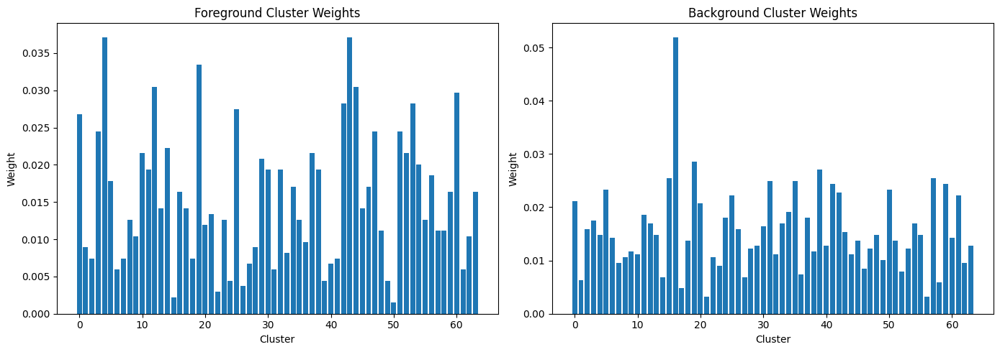

In [19]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.bar(range(len(fg_weights)), fg_weights)
plt.title('Foreground Cluster Weights')
plt.xlabel('Cluster')
plt.ylabel('Weight')

plt.subplot(1, 2, 2)
plt.bar(range(len(bg_weights)), bg_weights)
plt.title('Background Cluster Weights')
plt.xlabel('Cluster')
plt.ylabel('Weight')

plt.tight_layout()
plt.show()

### Pixel likelihood

In [20]:
def calculate_likelihood(pixel, centroids, weights, wk=0.1):
    """ Calculate the likelihood of a pixel belonging to each cluster without squaring the Euclidean distance.
    
    Parameters:
    - pixel: The RGB values for the pixel.
    - centroids: The RGB values of the cluster centroids.
    - weights: The weight of each centroid based on the number of pixels it contains.
    - wk: The weighting factor for each centroid.
    Returns:
    - The likelihood of the pixel belonging to the clusters.
    """
    # euclidean distances from the pixel to each centroid
    distances = np.linalg.norm(pixel - centroids, axis=1)
    # exponential function to negative of these distances
    likelihoods = np.exp(-distances)
    # exponential function to negative of these distances
    #likelihoods = np.exp(-distances ** 2)
    
    # Multiplying by weighting factor and summing to obtain overall likelihood
    total_likelihood = np.sum(wk * weights * likelihoods)
    return total_likelihood

### Classifying pixels in the image as foreground or background based on likelihood.

In [21]:
def classify_pixels(image, fg_centroids, fg_weights, bg_centroids, bg_weights, wk=0.1):
    """
    Parameters:
    - image: The original RGB image as a numpy array.
    - fg_centroids: RGB values of the foreground cluster centroids.
    - fg_weights: Weights of the foreground centroids.
    - bg_centroids: RGB values of the background cluster centroids.
    - bg_weights: Weights of the background centroids.
    - wk: The weighting factor for each centroid (default is 0.1).

    Returns:
    - segmentation_mask: A binary mask indicating foreground and background pixels.
    """
    height, width = image.shape[:2]
    segmentation_mask = np.zeros((height, width), dtype=np.uint8)
    
    for i in range(height):
        for j in range(width):
            pixel = image[i, j]
            foreground_likelihood = calculate_likelihood(pixel, fg_centroids, fg_weights, wk)
            background_likelihood = calculate_likelihood(pixel, bg_centroids, bg_weights, wk)
            
            # Assign to foreground if likelihood is higher than background
            segmentation_mask[i, j] = int(foreground_likelihood > background_likelihood)
    
    return segmentation_mask

In [22]:
segmentation_mask = classify_pixels(
    lady_original_np, fg_centroids, fg_weights, bg_centroids, bg_weights, wk=0.1
)

### binary mask to segment the original image

In [23]:
def create_segmented_image(original_image, mask):
    # The mask should be 2D array with same width and height as original image, # 1s = foreground and 0s =background 
    # Convert the mask to a 3-channel image
    mask_3channel = np.stack((mask,)*3, axis=-1)

    # Use the mask to select the foreground
    segmented_image = np.where(mask_3channel, original_image, 0)
    return segmented_image

In [24]:
lady_segmented = create_segmented_image(lady_original_np, segmentation_mask)

### Postprocessing

In [25]:
from skimage import morphology
from skimage.measure import label
from skimage.color import label2rgb

def post_process_segmentation(segmented_image, mask):
    # Convert mask to binary
    binary_mask = mask.astype(np.uint8)
    # morphological operations
    cleaned_mask = morphology.opening(binary_mask, morphology.disk(3))
    cleaned_mask = morphology.closing(cleaned_mask, morphology.disk(3))
    # Label connected components
    labeled_mask = label(cleaned_mask)
    
    # Optionally, remove small objects (less than a certain size)
    cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=250)
    
    # Recreate segmented image with cleaned mask
    cleaned_segmented_image = np.where(np.stack((cleaned_mask,)*3, axis=-1), segmented_image, 0)
    return cleaned_segmented_image

In [26]:
lady_segmented_post_processed = post_process_segmentation(lady_segmented, segmentation_mask)

### Displaying results

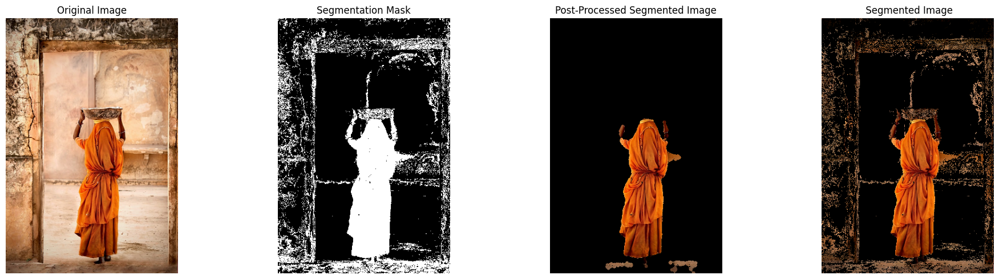

In [27]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(lady_original_np)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(segmentation_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(lady_segmented_post_processed)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(lady_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

#### verifying seeds

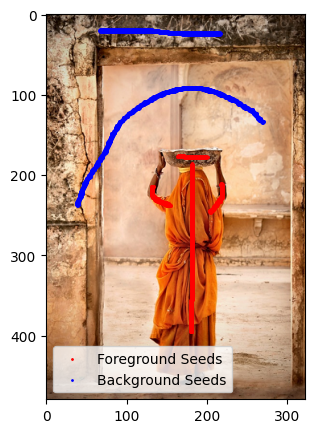

In [28]:
plt.figure(figsize=(10, 5))
plt.imshow(lady_original_np)
plt.scatter(foreground_coords[:, 1], foreground_coords[:, 0], s=1, c='r', label='Foreground Seeds')
plt.scatter(background_coords[:, 1], background_coords[:, 0], s=1, c='b', label='Background Seeds')
plt.legend()
plt.show()

In [29]:
test_pixel_fg = lady_original_np[foreground_coords[0, 0], foreground_coords[0, 1]]
test_pixel_bg = lady_original_np[background_coords[0, 0], background_coords[0, 1]]

# likelihood for a known foreground pixel
likelihood_fg = calculate_likelihood(test_pixel_fg, fg_centroids, fg_weights, wk=0.1)
# likelihood for a known background pixel
likelihood_bg = calculate_likelihood(test_pixel_bg, bg_centroids, bg_weights, wk=0.1)

print(f"Foreground likelihood: {likelihood_fg}")
print(f"Background likelihood: {likelihood_bg}")

Foreground likelihood: 2.085061994599027e-11
Background likelihood: 5.439833103726037e-07


# TESTING

### Using K-64

1. VanGogh

In [30]:
van = load_image(base_dir / 'van Gogh.PNG')

In [31]:
van_stroke = load_image(base_dir / 'van Gogh stroke.PNG')

In [32]:
vfc, vbc = extract_seeds(van_stroke)

# RGB values for the foreground seeds
vforeground_rgb = van[vfc[:, 0], vfc[:, 1]]
# RGB values for the background seeds
vbackground_rgb = van[vbc[:, 0], vbc[:, 1]]

In [33]:
# k-means on foreground seeds
vfgc, vfgl = k_means(vforeground_rgb, k=64, max_iters=100, tolerance=0.01)
# k-means on background seeds
vbgc, vbgl = k_means(vbackground_rgb, k=64, max_iters=100, tolerance=0.01)

In [34]:
vf_weights = calculate_cluster_weights(vfgl, k=64)
vb_weights = calculate_cluster_weights(vbgl, k=64)

In [35]:
vans_mask = classify_pixels(
    van, vfgc, vf_weights, vbgc, vb_weights, wk=0.1
)

In [36]:
van_segmented = create_segmented_image(van, vans_mask)

In [37]:
van_pp = post_process_segmentation(van_segmented, vans_mask)

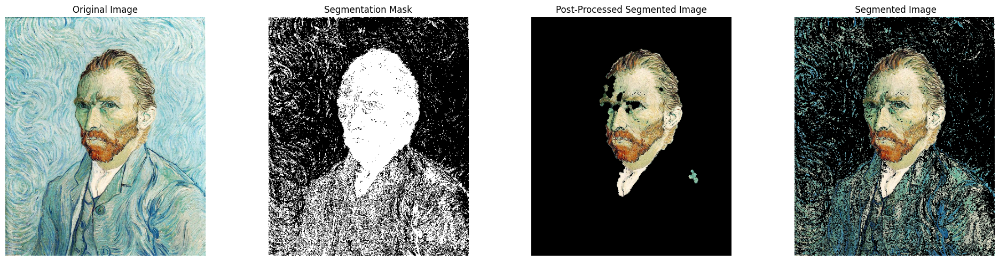

In [38]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(van)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(vans_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(van_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(van_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

2. MonaLisa

In [39]:
mona = load_image(base_dir / 'Mona-lisa.PNG')

In [40]:
m_stroke = load_image(base_dir / 'Mona-lisa stroke 1.PNG')
#m_stroke = load_image(base_dir / 'Mona-lisa stroke 2.PNG')

In [41]:
mfc, mbc = extract_seeds(m_stroke)

# RGB values for the foreground seeds
mforeground_rgb = mona[mfc[:, 0], mfc[:, 1]]
# RGB values for the background seeds
mbackground_rgb = mona[mbc[:, 0], mbc[:, 1]]

In [42]:
# k-means on foreground seeds
mfgc, mfgl = k_means(mforeground_rgb, k=64, max_iters=100, tolerance=0.01)
# k-means on background seeds
mbgc, mbgl = k_means(mbackground_rgb, k=64, max_iters=100, tolerance=0.01)

In [43]:
mf_weights = calculate_cluster_weights(mfgl, k=64)
mb_weights = calculate_cluster_weights(mbgl, k=64)

In [44]:
mona_mask = classify_pixels(
    mona, mfgc, mf_weights, mbgc, mb_weights, wk=0.1
)

In [45]:
mona_segmented = create_segmented_image(mona, mona_mask)

In [46]:
mona_pp = post_process_segmentation(mona_segmented, mona_mask)

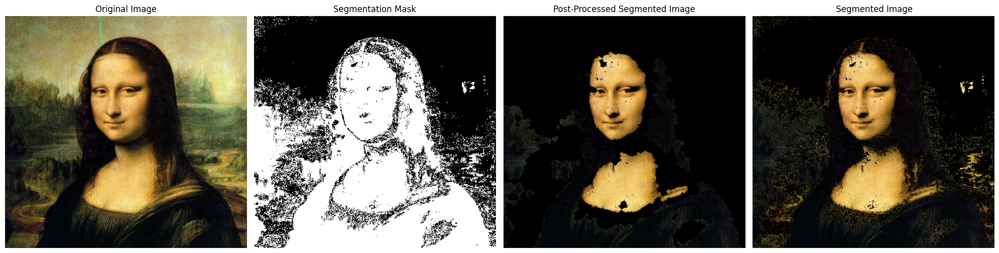

In [47]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(mona)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mona_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(mona_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(mona_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Using K=16

1. VanGogh

In [86]:
vfc, vbc = extract_seeds(van_stroke)

# RGB values for the foreground seeds
vforeground_rgb = van[vfc[:, 0], vfc[:, 1]]
# RGB values for the background seeds
vbackground_rgb = van[vbc[:, 0], vbc[:, 1]]

In [87]:
# k-means on foreground seeds
vfgc, vfgl = k_means(vforeground_rgb, k=16, max_iters=100, tolerance=0.01)
# k-means on background seeds
vbgc, vbgl = k_means(vbackground_rgb, k=16, max_iters=100, tolerance=0.01)

In [88]:
vf_weights = calculate_cluster_weights(vfgl, k=16)
vb_weights = calculate_cluster_weights(vbgl, k=16)

In [89]:
vans_mask = classify_pixels(
    van, vfgc, vf_weights, vbgc, vb_weights, wk=0.1
)

In [90]:
van_segmented = create_segmented_image(van, vans_mask)

In [91]:
van_pp = post_process_segmentation(van_segmented, vans_mask)

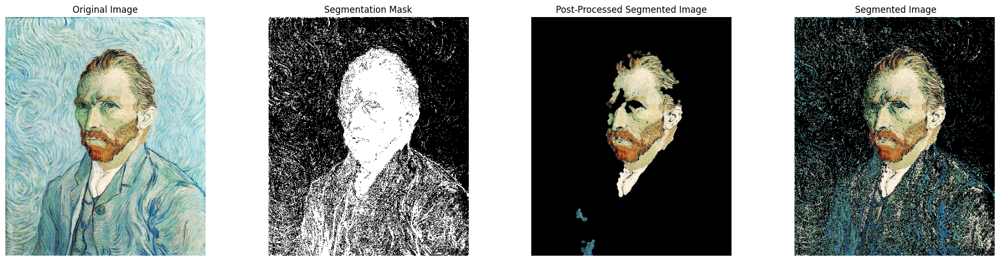

In [92]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(van)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(vans_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(van_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(van_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

2. MonaLisa

In [93]:
# k-means on foreground seeds
mfgc, mfgl = k_means(mforeground_rgb, k=16, max_iters=100, tolerance=0.01)
# k-means on background seeds
mbgc, mbgl = k_means(mbackground_rgb, k=16, max_iters=100, tolerance=0.01)

In [94]:
mf_weights = calculate_cluster_weights(mfgl, k=16)
mb_weights = calculate_cluster_weights(mbgl, k=16)

In [95]:
mona_mask = classify_pixels(
    mona, mfgc, mf_weights, mbgc, mb_weights, wk=0.1
)

In [96]:
mona_segmented = create_segmented_image(mona, mona_mask)

In [97]:
mona_pp = post_process_segmentation(mona_segmented, mona_mask)

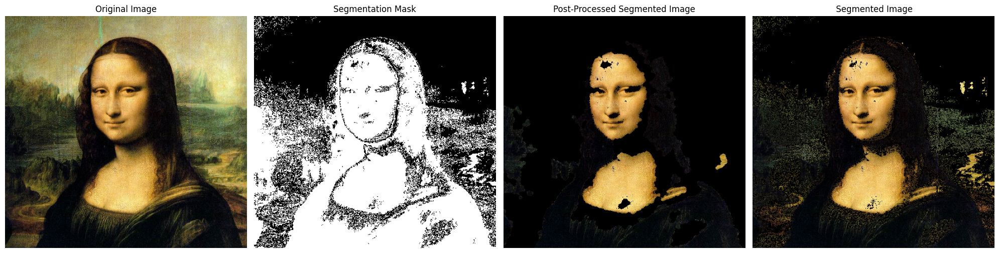

In [98]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(mona)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mona_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(mona_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(mona_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Using K=32

1. VanGogh

In [57]:
vfc, vbc = extract_seeds(van_stroke)

# RGB values for the foreground seeds
vforeground_rgb = van[vfc[:, 0], vfc[:, 1]]
# RGB values for the background seeds
vbackground_rgb = van[vbc[:, 0], vbc[:, 1]]

In [58]:
# k-means on foreground seeds
vfgc, vfgl = k_means(vforeground_rgb, k=32, max_iters=100, tolerance=0.01)
# k-means on background seeds
vbgc, vbgl = k_means(vbackground_rgb, k=32, max_iters=100, tolerance=0.01)

In [59]:
vf_weights = calculate_cluster_weights(vfgl, k=32)
vb_weights = calculate_cluster_weights(vbgl, k=32)

In [60]:
vans_mask = classify_pixels(
    van, vfgc, vf_weights, vbgc, vb_weights, wk=0.1
)

In [61]:
van_segmented = create_segmented_image(van, vans_mask)

In [62]:
van_pp = post_process_segmentation(van_segmented, vans_mask)

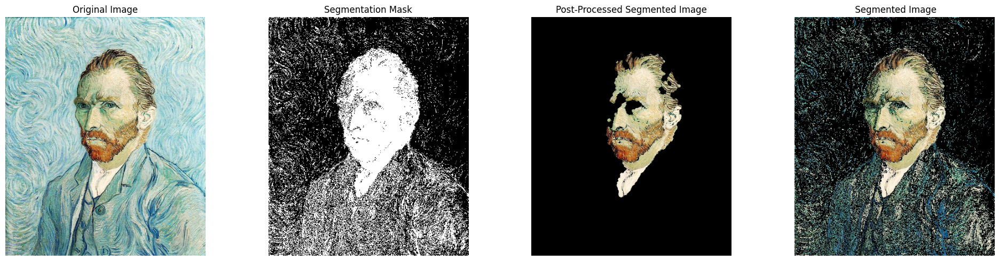

In [63]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(van)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(vans_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(van_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(van_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

2. MonaLisa

In [64]:
mfc, mbc = extract_seeds(m_stroke)

# RGB values for the foreground seeds
mforeground_rgb = mona[mfc[:, 0], mfc[:, 1]]
# RGB values for the background seeds
mbackground_rgb = mona[mbc[:, 0], mbc[:, 1]]

In [65]:
# k-means on foreground seeds
mfgc, mfgl = k_means(mforeground_rgb, k=32, max_iters=100, tolerance=0.01)
# k-means on background seeds
mbgc, mbgl = k_means(mbackground_rgb, k=32, max_iters=100, tolerance=0.01)

In [66]:
mf_weights = calculate_cluster_weights(mfgl, k=32)
mb_weights = calculate_cluster_weights(mbgl, k=32)

In [67]:
mona_mask = classify_pixels(
    mona, mfgc, mf_weights, mbgc, mb_weights, wk=0.1
)

In [68]:
mona_segmented = create_segmented_image(mona, mona_mask)

In [69]:
mona_pp = post_process_segmentation(mona_segmented, mona_mask)

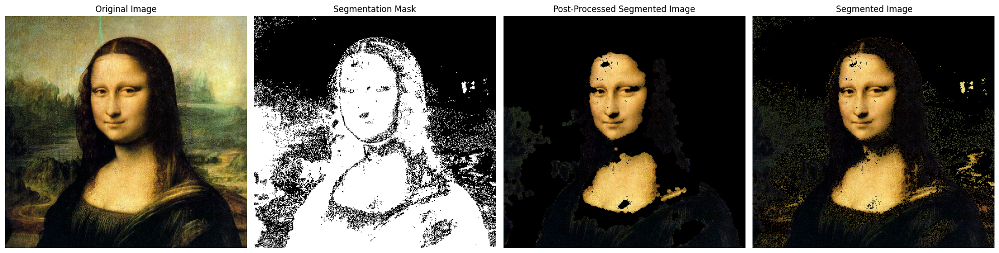

In [70]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(mona)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mona_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(mona_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(mona_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

### Using K=128

1. VanGogh

In [72]:
vfc, vbc = extract_seeds(van_stroke)

# RGB values for the foreground seeds
vforeground_rgb = van[vfc[:, 0], vfc[:, 1]]
# RGB values for the background seeds
vbackground_rgb = van[vbc[:, 0], vbc[:, 1]]

In [73]:
# k-means on foreground seeds
vfgc, vfgl = k_means(vforeground_rgb, k=128, max_iters=100, tolerance=0.01)
# k-means on background seeds
vbgc, vbgl = k_means(vbackground_rgb, k=128, max_iters=100, tolerance=0.01)

In [74]:
vf_weights = calculate_cluster_weights(vfgl, k=128)
vb_weights = calculate_cluster_weights(vbgl, k=128)

In [75]:
vans_mask = classify_pixels(
    van, vfgc, vf_weights, vbgc, vb_weights, wk=0.1
)

In [76]:
van_segmented = create_segmented_image(van, vans_mask)

In [77]:
van_pp = post_process_segmentation(van_segmented, vans_mask)

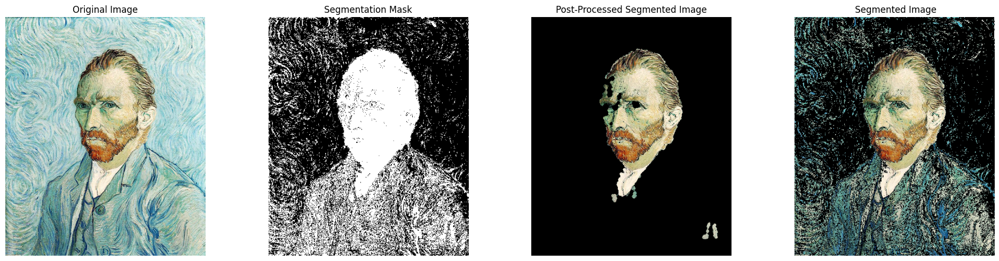

In [78]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(van)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(vans_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(van_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(van_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()

2. MonaLisa

In [79]:
mfc, mbc = extract_seeds(m_stroke)

# RGB values for the foreground seeds
mforeground_rgb = mona[mfc[:, 0], mfc[:, 1]]
# RGB values for the background seeds
mbackground_rgb = mona[mbc[:, 0], mbc[:, 1]]

In [80]:
# k-means on foreground seeds
mfgc, mfgl = k_means(mforeground_rgb, k=128, max_iters=100, tolerance=0.01)
# k-means on background seeds
mbgc, mbgl = k_means(mbackground_rgb, k=128, max_iters=100, tolerance=0.01)

In [81]:
mf_weights = calculate_cluster_weights(mfgl, k=128)
mb_weights = calculate_cluster_weights(mbgl, k=128)

In [82]:
mona_mask = classify_pixels(
    mona, mfgc, mf_weights, mbgc, mb_weights, wk=0.1
)

In [83]:
mona_segmented = create_segmented_image(mona, mona_mask)

In [84]:
mona_pp = post_process_segmentation(mona_segmented, mona_mask)

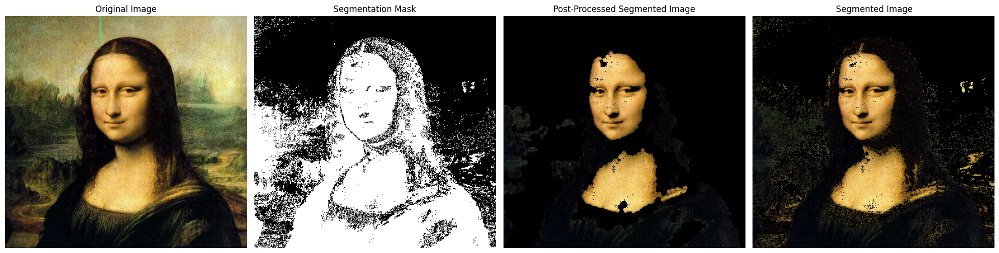

In [85]:
plt.figure(figsize=(20, 5))

plt.subplot(1, 4, 1)
plt.imshow(mona)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mona_mask, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(mona_pp)
plt.title('Post-Processed Segmented Image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(mona_segmented)
plt.title(' Segmented Image')
plt.axis('off')

plt.tight_layout()
plt.show()